# «Модель прогнозирования стоимости жилья для агентства недвижимости

##### Ваша задача — разработать модель, которая позволила бы агентству недвижимости обойти конкурентов по скорости и качеству совершения сделок.

1) Провести разведывательный анализ и очистку исходных данных.
2) Выделить наиболее значимые факторы, влияющие на стоимость недвижимости.
3) Построить модель для прогнозирования стоимости недвижимости.
4) Разработать небольшой веб-сервис, на вход которому поступают данные о некоторой выставленной на продажу недвижимости, а сервис прогнозирует его стоимость

#### Импорт необходимых библиотек

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

import missingno
from uszipcode import SearchEngine #библиотека поиска данных 

import re
from ydata_profiling import ProfileReport #библиотека для EDA

c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


#### Описание исходных данных

- 'status' — статус продажи;
- 'private pool' и 'PrivatePool' — наличие собственного бассейна;
- 'propertyType' — тип объекта недвижимости;
- 'street' — адрес объекта;
- 'baths' — количество ванных комнат;
- 'homeFacts' — сведения о строительстве объекта (содержит несколько
типов сведений, влияющих на оценку объекта);
- 'fireplace' — наличие камина;
- 'city' — город;
- 'schools' — сведения о школах в районе;
- 'sqft' — площадь в футах;
- 'zipcode' — почтовый индекс;
- 'beds' — количество спален;
- 'state' — штат;
- 'stories' — количество этажей;
- 'mls-id' и 'MlsId' — идентификатор MLS (Multiple Listing Service, система
мультилистинга);
- 'target' — цена объекта недвижимости (целевой признак, который
необходимо спрогнозировать).

#### Загрузка данных

In [2]:
df = pd.read_csv('data.csv') 
df.head(3)

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
0,Active,NaN,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,NaN,NaN,611019,"$418,000"
1,for sale,NaN,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,NaN,NaN,201916904,"$310,000"
2,for sale,NaN,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,NaN,yes,FR19221027,"$2,895,000"


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103114 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226469 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

In [4]:
#быстро проанализируем данные c ProfileReport и далее перейдем к более детальному анализу
profile = ProfileReport(df, title="Data analitical preview")
profile.to_file("Data_analitical_preview.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [197]:
#profile

Первые выводы по итогам превью данных:

1) 17 признаков, 1 зависимая переменная
2) 377 185 наблюдений
3) 27.5% пропусков в данных (1869153)
4) 49 дубликатов
5)  15 текстовых признаков, 1 категориальный, 2 - бинарные
6) 	2481 наблюдений с пропусками в целевой переменной

- Признаки - private pool и PrivatePool потребуют объединения (но из-за большого числа пропусков 98.9% и 89.3% возможно не самый полезный признак)
- Признаки - MlsId и mls-id также потребуют объединения
- Признаки -baths, sqft, beds, stories,  target потребуется привести к единому формату в рамках признака
- Признаки - homeFacts, schools потребуют детального изучения 
- Признак - propertyType - потребует обработки для того, чтобы привести к корректному типированию категорий
- Признаки - street, city, zipcode, state - в целом об одном и том же, скорее всего получится выбрать из них наиболее информативный/ные и от остальных отказаться
- Признак - fireplace - возможно не самый полезный признак, тк в нем 72.7% пропусков

## Проведем первичную обработку данных 

In [5]:
#удалим дубликаты
print('Количество дубликатов: {}'.format(df[df.duplicated()].shape[0]))
df = df.drop_duplicates()
df.shape

Количество дубликатов: 50


(377135, 18)

In [7]:
#зафиксируем для удобства наличие пропусков
cols_null_percent = df.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display(cols_with_null)

private pool    98.891378
mls-id          93.386453
PrivatePool     89.311520
fireplace       72.659393
stories         39.952272
baths           28.188315
beds            24.196640
MlsId           17.730786
sqft            10.752118
status          10.584274
propertyType     9.209699
target           0.657589
city             0.009015
street           0.000530
dtype: float64

более 50% пропусков имеют поля private pool,mls-id,PrivatePool,fireplace

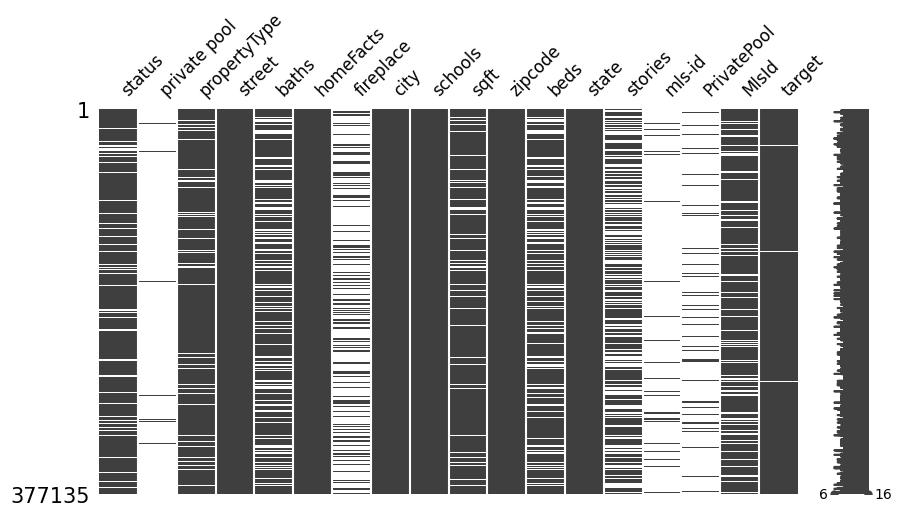

In [8]:
#и посмотрим на них
missingno.matrix(df,figsize=(10,5), fontsize=12);

In [9]:
#удалим те наблюдения которые содержат более 11 пропусков (т.е. 65% данных по ним не заполнены)
df = df.dropna(thresh = 9 )
print('Количество строк после удаления мусорных записей: {}'.format(df.shape[0]))

Количество строк после удаления мусорных записей: 376767


Для того, чтобы в дальнейшем попытаться вывести модель в продакшн отложим несколько необработанных наблюдений

In [10]:
prod_test = df.sample(n=5)
prod_test.to_csv('output\prod_test_main.csv')
df = df[~df.index.isin(prod_test.index)]
prod_test

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
131212,for sale,NaN,mobile/manufactured,10830 SE 226th St #13,2 Baths,"{'atAGlanceFacts': [{'factValue': '1986', 'fac...",NaN,Kent,"[{'rating': ['4/10', '2/10', '5/10'], 'data': ...","1,120 sqft",98031,3 Beds,WA,NaN,NaN,NaN,1506197,"$83,500"
152353,for sale,NaN,lot/land,257 Beach Rd N #257,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Wilmington,"[{'rating': ['5/10', '5/10', '6/10'], 'data': ...",NaN,28411,NaN,NC,1.0,NaN,NaN,100160055,"$1,995,000"
351508,Active,NaN,NaN,MLS #: TNNY1862224,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,New York,"[{'rating': ['10', '8', '9', '8', '8'], 'data'...",NaN,10022,NaN,NY,NaN,NaN,NaN,TNNY1862224,"4,220,000"
69511,for sale,NaN,lot/land,Zinnia Ln W,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Kissimmee,"[{'rating': ['5/10', '4/10', '3/10'], 'data': ...",NaN,34759,NaN,FL,NaN,NaN,NaN,S5025408,"$38,900"
10927,Pending,NaN,Single Family Home,12136 Spring Trl,2,"{'atAGlanceFacts': [{'factValue': '1948', 'fac...",NaN,Sylmar,"[{'rating': ['4', '2', '6', '4', '5', '7', 'NR...",1503,91342,3,CA,One Level,NaN,NaN,SR19245373,"$679,900"


## Дательная обработка данных

In [13]:
#подготовим функцию, которая обработает стандартные моменты для выделения числового признака

def clean_factor_numb (data):
    #скорректируем регистр и удалим избыточные начальные и конечные пробельные символы
    result = str(data).lower().strip()
    #оставим только числовые значения
    result = re.findall(r'\b\d+\b', result)
    result = ''.join(result)
    return result
    

### Обработка целевого признака target

In [14]:
#при первичном анлизе выяснили, что признак содержит 0.7% пропусков - это 2481 наблюдений, удалим их
df = df.dropna(subset=['target'])
print(df.shape)

print('____________')

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df['target'].str.findall('[^0-9]'))
print(simbols.value_counts())

print('____________')

#применим функцию для очистки признака
df['target_clean'] = df['target'].apply(clean_factor_numb).astype(float)

#далее посмотрим как выглядит очищенный признак (в тыс долларах)
round(df['target_clean'].describe()/1000,3)


(374524, 18)
____________
target
[$, ,]                            267323
[,]                                55868
[$, ,, ,]                          33601
[,, ,]                             10000
[$, ,, +]                           6925
[$, ,, /, m, o]                      373
[$, ,, ,, +]                         332
[$]                                   64
[$, /, m, o]                          24
[]                                    13
[$, ,,  , -,  , $, ,, /, m, o]         1
Name: count, dtype: int64
____________


count       374.524
mean        644.883
std        1841.746
min           0.001
25%         187.000
50%         320.000
75%         582.678
max      195000.000
Name: target_clean, dtype: float64

In [21]:
df['target_clean']

0          418000.0
1          310000.0
2         2895000.0
3         2395000.0
4            5000.0
            ...    
377179     799000.0
377180    1249000.0
377181     674999.0
377182     528000.0
377184     204900.0
Name: target_clean, Length: 374524, dtype: float64

In [6]:
#обнаружен интересный символ 'mo' - скорее всего это обозначает помесячные платежи. таких кейсов 398
print(df[df['target'].str.contains('mo')]['target'].count())

df[df['target'].str.contains('mo')]['target']

#пока не буду обрабатывать как-то данную информацию, но учту это для дальнейшего исследования
# (тк вероятно, будет корректно умножить данные числа на 12, чтобы получить годовой показатель)

398


547        $5,500/mo
609       $10,500/mo
2075       $6,390/mo
3025       $1,200/mo
3645       $3,600/mo
             ...    
371791       $890/mo
372459     $2,500/mo
374288     $2,000/mo
375550     $1,500/mo
376976     $1,900/mo
Name: target, Length: 398, dtype: object

In [ ]:
#удалим избыточные столбцы
#df = df.drop('target', axis=1)

Максимальная цена на недвижимость в данных - 195 млн долларов. Одно наблюдение, дом на продажу в Лос Анжелесе (11 спален, бассейн, 18 ванных комнат, камин и проч.) выглядит реалистично
Минимальная цена на недвижимость в данных -  1 доллар. 13 наблюдений, в чем причина таких цен, будем выяснять позднее

Средняя цена - 644 тыс долларов
Медианная - 320 тыс долларов

In [7]:
#исследуем граничные наблюдения
display(df[df['target_clean'] == 195000000])

print('-------------------')

display(df[df['target_clean'] == 1].head(3))

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target,target_clean
132425,For sale,NaN,Single Family,875 Nimes Rd,18.0,"{'atAGlanceFacts': [{'factValue': '1935', 'fac...",Yes,Los Angeles,"[{'rating': ['10/10', '7/10'], 'data': {'Dista...",--,90077,11,CA,2,NaN,Yes,18398466,"$195,000,000",195000000


-------------------


,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target,target_clean
15533,Active,NaN,Single Family Home,1230 Old Dickerson Rd,2,"{'atAGlanceFacts': [{'factValue': '1940', 'fac...",NaN,Goodlettsville,"[{'rating': ['3', '2', '3', '3', '2', '1', 'NR...",1596,37072,3.0,TN,1.00,NaN,NaN,2108367,$1,1
25334,NaN,NaN,Single Family,3205 N High School Rd,1.0,"{'atAGlanceFacts': [{'factValue': '1957', 'fac...",Yes,Indianapolis,"[{'rating': ['2/10', 'NA', '1/10'], 'data': {'...","1,586",46224,3,IN,0,NaN,NaN,21683478,$1,1
84951,foreclosure,NaN,lot/land,7804 Hamilton Ave,NaN,"{'atAGlanceFacts': [{'factValue': '1865', 'fac...",yes,Cincinnati,"[{'rating': ['2/10'], 'data': {'Distance': ['0...","2,536 sqft",45231,6 Beds,OH,2.0,NaN,NaN,1623043,$1,1


<Axes: xlabel='log_target_clean', ylabel='Count'>

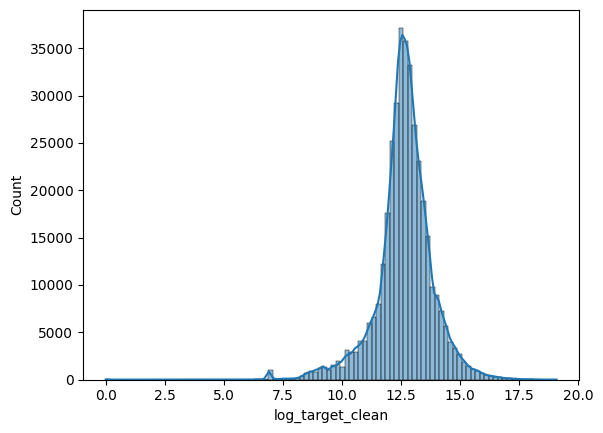

In [26]:
#визуализируем целевую переменную в log масштабе, тк разброс реальной переменной достаточно велик
df['log_target_clean'] = np.log(df['target_clean'])
sns.histplot(df['log_target_clean'], bins=100, kde= True)

Замечательное лог нормальное распределение))) 

In [41]:
#сделаем копию данных
df_c = df.copy()

### Обработка прочих признаков

In [42]:
#объединим данные private pool и PrivatePool и удалим избыточные колонки после преобразования
print(df_c['private pool'].str.lower().unique())
print(df_c['PrivatePool'].str.lower().unique())

print('_____________')
print(df_c['PrivatePool'].str.lower().value_counts())

print('_____________')
print(df_c['private pool'].str.lower().value_counts())

print('_____________')
#при этом так как заполняемость PrivatePool существенно выше (40310 наблюдения), то будем "обогащать" информацию этого признака данными из принака private pool (4181 наблюдений)
df_c['private_pool_join'] = df_c['PrivatePool'].str.lower().combine_first(df_c['private pool'].str.lower())
print(df_c['private_pool_join'].value_counts())

#удалим избыточные столбцы
df_c = df_c.drop(['PrivatePool', 'private pool'], axis=1)

[nan 'yes']
[nan 'yes']
_____________
PrivatePool
yes    40120
Name: count, dtype: int64
_____________
private pool
yes    4151
Name: count, dtype: int64
_____________
private_pool_join
yes    44271
Name: count, dtype: int64


In [43]:
#закодируем признак 1/0, пустые значения также примем за отсуствие бассейна
df_c['private_pool_join']= df_c['private_pool_join'].apply(lambda x: 1 if x == 'yes' else 0 )
df_c['private_pool_join'].value_counts()

private_pool_join
0    330253
1     44271
Name: count, dtype: int64

''

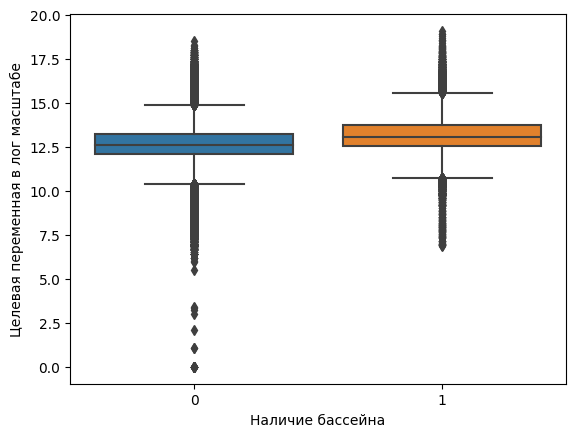

In [32]:
#визуализируем
boxplot1 = sns.boxplot(data=df_c, x="private_pool_join", y="log_target_clean")
boxplot1.set_xlabel('Наличие бассейна')
boxplot1.set_ylabel('Целевая переменная в лог масштабе')
;

In [33]:
#посмотрим распределения, в тыс долларах
round(df_c['target_clean'].groupby(df_c['private_pool_join']).describe()/1000,2)

,count,mean,std,min,25%,50%,75%,max
private_pool_join,,,,,,,,
0,330.25,572.04,1444.87,0.00,177.90,300.0,548.0,110000.0
1,44.27,1188.29,3576.02,0.95,281.95,467.0,945.0,195000.0


Не смотря на то, что визуально на графике существенных различий в группах не видно (тут скорее вопрос корректных масштабов)
В сгруппированных данных есть отличия в средних и медианных значения целевой переменной (при наличие бассейна показатели выше)

In [44]:
# Признаки 'mls-id' и 'MlsId' — идентификатор MLS (Multiple Listing Service, система мультилистинга). как можно использовать эти данные сказать сложно, предложу буллевую переменную
# возможно наличие самого индентификатора что-то будет значить для оценки целевой переменной

#MlsId и mls-id также потребуют объединения и удалим избыточные колонки после преобразования
print(df_c['MlsId'].count())
print(df_c['mls-id'].count())

print('_____________')

#при этом так как заполняемость MlsId существенно выше (310187 наблюдения), то будем "обогащать" информацию этого признака данными из принака mls-id (24937 наблюдений)
df_c['mlsid_join'] = df_c['MlsId'].combine_first(df_c['mls-id'])
print(df_c['mlsid_join'].count())

#удалим избыточные столбцы
df_c = df_c.drop(['MlsId', 'mls-id'], axis=1)

print('_____________')
#количество и доля пропусков
print('Количество пропусков', df_c['mlsid_join'].isna().sum())
print('Доля пропусков',df_c['mlsid_join'].isna().sum()/len(df_c))

#заменим пустые значения на NA
df_c['mlsid_join'] = df_c['mlsid_join'].fillna('NA')

print('_____________')

#закодируем признак 1/0 считая что при отсутствии значения объект не состоит в системе мультилистинга
df_c['mlsid_join_bool']= df_c['mlsid_join'].apply(lambda x: 0 if x =='NA' else 1 )
df_c['mlsid_join_bool'].value_counts()

310182
24937
_____________
335119
_____________
Количество пропусков 39405
Доля пропусков 0.10521355106748834
_____________


mlsid_join_bool
1    335119
0     39405
Name: count, dtype: int64

''

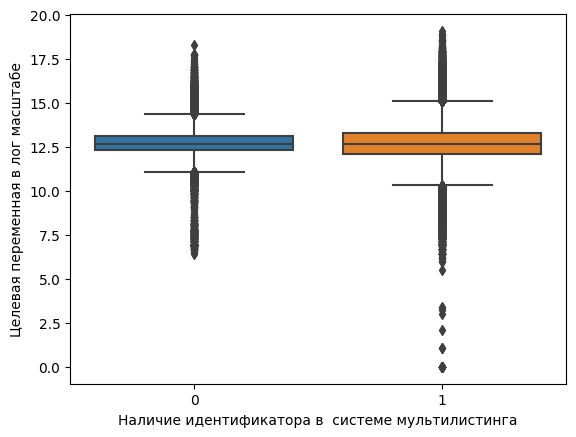

In [36]:
#визуализируем
boxplot2 = sns.boxplot(data=df_c, x="mlsid_join_bool", y="log_target_clean")
boxplot2.set_xlabel('Наличие идентификатора в  системе мультилистинга')
boxplot2.set_ylabel('Целевая переменная в лог масштабе')
;

In [37]:
#посмотрим распределения, в тыс долларах
round(df_c['target_clean'].groupby(df_c['mlsid_join_bool']).describe()/1000,2)

,count,mean,std,min,25%,50%,75%,max
mlsid_join_bool,,,,,,,,
0,39.40,551.22,1388.00,0.6,224.98,322.36,508.99,88000.0
1,335.12,655.90,1887.64,0.0,180.00,320.00,595.00,195000.0


Существенных различий по данному признаку не наблюдается

После удаления избыточных признаков наличия бассейна и id объекта, проверим еще раз на наличие дубликатов и удалим их, если таковые найдутсяю Причем, признак 'mlsid_join'не будет участвовать в сравнении строк:

In [45]:
print('Количество дубликатов: {}'.format(df_c[df_c.duplicated(subset=df_c.columns.difference(['mlsid_join']))].shape[0]))

df_c = df_c.drop_duplicates(subset=df_c.columns.difference(['mlsid_join']))
print('Размер таблицы (строки) после удаления дубликатов: {}'.format(df_c.shape[0]))

Количество дубликатов: 91
Размер таблицы (строки) после удаления дубликатов: 374433


In [46]:
#проведем анализ и очистку признака sqft
#количество и доля пропусков
print('Количество пропусков', df_c['sqft'].isna().sum())
print('Доля пропусков',(round(df_c['sqft'].isna().sum()/len(df_c),3)))

print('____________')

#заменим пропуски на нули
df_c['sqft'] = df_c['sqft'].fillna(0)

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_c['sqft'].str.findall('[^0-9]'))
print(simbols.value_counts())

print('____________')

#применим функцию для очистки признака
df_c['sqft_clean'] = df_c['sqft'].apply(clean_factor_numb)
df_c['sqft_clean'] = df_c['sqft_clean'].fillna(0).replace('').astype('int')

#далее посмотрим как выглядит очищенный признак в кв метрах для понимания
round(df_c['sqft_clean'].describe()/10.76,2)
# ps 1 фут равен ок 30 см.  а 1 кв метр это 10.76391042 кв футов


Количество пропусков 39952
Доля пропусков 0.107
____________
sqft
[,,  , s, q, f, t]                                                                                           138812
[,]                                                                                                           91443
[]                                                                                                            61548
[T, o, t, a, l,  , i, n, t, e, r, i, o, r,  , l, i, v, a, b, l, e,  , a, r, e, a, :,  , ,,  , s, q, f, t]     21077
[ , s, q, f, t]                                                                                               18504
[T, o, t, a, l,  , i, n, t, e, r, i, o, r,  , l, i, v, a, b, l, e,  , a, r, e, a, :,  ,  , s, q, f, t]         2266
[-, -]                                                                                                          534
[-, -,  , s, q, f, t]                                                                                           276
[,, ,,

count       34798.61
mean          551.29
std        139391.00
min             0.00
25%            96.65
50%           154.28
75%           228.72
max      73975783.46
Name: sqft_clean, dtype: float64

Посмотрим на график зависимости цены от размера объекта. Видим визуально 2 выброса - исключу их заменим максимумумом без этих значений

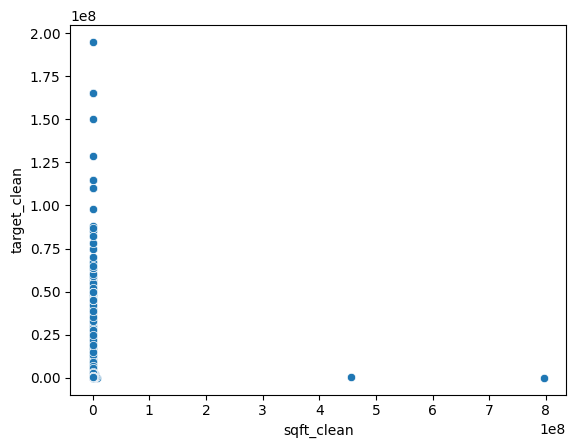

In [47]:
sns.scatterplot(data=df_c, x="sqft_clean", y="target_clean");

In [48]:
max_sqft_clean = df_c[df_c['sqft_clean']<=7078574]['sqft_clean'].max()
df_c['sqft_clean'] = df_c['sqft_clean'].apply(lambda x: max_sqft_clean if x >7078574 else x)

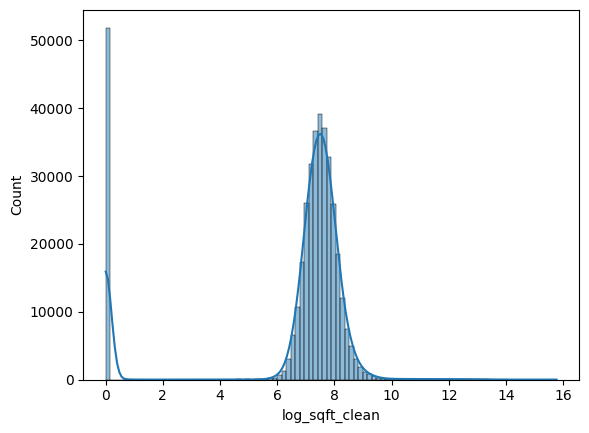

In [49]:
df_c['log_sqft_clean'] = np.log(df_c['sqft_clean']+1)
sns.histplot(df_c['log_sqft_clean'], bins=100, kde= True);

In [50]:
#удалим избыточные столбцы
df_c = df_c.drop( 'sqft', axis=1)

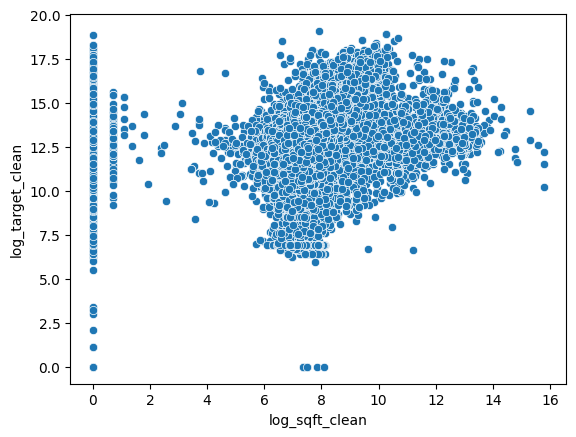

In [51]:
#посмотрим есть ли зависимость признаков
sns.scatterplot(data=df_c, x="log_sqft_clean", y="log_target_clean");

In [52]:
#проведем анализ и очистку признака baths
#количество и доля пропусков
print('Количество пропусков', df_c['baths'].isna().sum())
print('Доля пропусков',df_c['baths'].isna().sum()/len(df_c))

print('____________')

#заменим пропуски на нули
df_c['baths'] = df_c['baths'].fillna(0)

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_c['baths'].str.findall('[^0-9]'))
print(simbols.value_counts())

print('____________')


#применим функцию для очистки признака
df_c['baths_clean'] = (df_c['baths'].str.replace('[^0-9.,]','',regex=True)).replace('..').replace('')
df_c['baths_clean'] = df_c['baths_clean'].str.replace(',','.').astype(float)
df_c['baths_clean'].nunique()



Количество пропусков 105172
Доля пропусков 0.2808833623104801
____________
baths
[ , B, a, t, h, s]                                        112903
[.]                                                        55560
[]                                                         47133
[B, a, t, h, r, o, o, m, s, :,  ]                          22987
[,]                                                        14354
[.,  , B, a, t, h, s]                                       7234
[ , b, a]                                                   6521
[., +]                                                       915
[~]                                                          780
[-, -,  , b, a, t, h, s]                                     495
[S, q, .,  , F, t, .,  ]                                     200
[.,  , b, a]                                                  76
[ , /,  ]                                                     63
[,, +]                                                        19
[ , b, a,

86

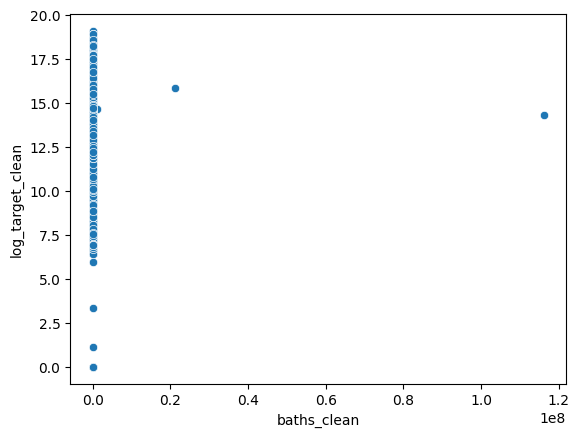

In [53]:
#посмотрим графически на данные
sns.scatterplot(data=df_c, x="baths_clean", y="log_target_clean");

In [54]:
#после очистки обнаруживаются странные наблюдения- очевидные выбросы - более 200 ванных комнат
df_c['baths_clean'].nlargest(10)

63514     116116116.0
301176     21211111.0
316488      1101010.0
24724         10101.0
85359          3122.0
110097         1111.0
1109            750.0
2022            750.0
3594            750.0
7564            750.0
Name: baths_clean, dtype: float64

In [55]:
#посмотрим на них подробнее и обработаем
df_c[df_c['baths_clean']>200][['baths','baths_clean']].sort_values('baths_clean', ascending=False)

,baths,baths_clean
63514,116 / 116 / 116,116116116.0
301176,2-1 / 2-1 / 1-1 / 1-1,21211111.0
316488,1 / 1-0 / 1-0 / 1-0,1101010.0
24724,1-0 / 1-0 / 1,10101.0
85359,3-1 / 2-2,3122.0
...,...,...
118294,750,750.0
122266,750,750.0
122876,750,750.0
376772,750,750.0


In [56]:
#заменим выбросы на медианное значение
median_baths = df_c[df_c['baths_clean']<=200]['baths_clean'].median()
df_c['baths_clean'] = df_c['baths_clean'].apply(lambda x: median_baths if x >200 else x)

In [91]:
#заменим пропуски на медианное значение
df_c['baths_clean'] = df_c['baths_clean'].fillna(median_baths)

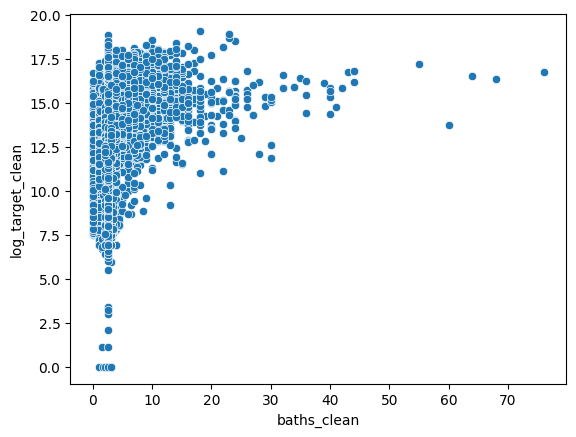

In [92]:
#посмотрим итогово есть ли зависимость признаков
sns.scatterplot(data=df_c, x="baths_clean", y="log_target_clean");

Некоторую закономерность проследить можно - чем больше ванных комнат- тем дороже недвижимость

In [ ]:
#удалим избыточные столбцы
df_c = df_c.drop('baths', axis=1)

In [61]:
#проведем анализ и очистку признака beds
#количество и доля пропусков
print('Количество пропусков', df_c['beds'].isna().sum())
print('Доля пропусков',(round(df_c['beds'].isna().sum()/len(df_c),3)))

print('____________')

#заменим пропуски на NA
df_c['beds'] = df_c['beds'].fillna('NA')

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_c['beds'].str.findall('[^0-9]'))
print(simbols.value_counts())


Количество пропусков 90877
Доля пропусков 0.24270563759070382
____________
beds
[ , B, e, d, s]                                                                                                                                                                                                                                                                                                      132363
[N, A]                                                                                                                                                                                                                                                                                                                90877
[]                                                                                                                                                                                                                                                                                              

В промежуточных итерациях предприняла несколько попыток в очистке и обработке данного признака, но все они не имели удовлетворительных результатов, поэтому приняла решение об исключении данного признака

In [62]:
#удалим избыточные столбцы
df_c = df_c.drop('beds', axis=1)

In [64]:
#проведем анализ и очистку признака fireplace
#количество и доля пропусков
print('Количество пропусков', df_c['fireplace'].isna().sum())
print('Доля пропусков',df_c['fireplace'].isna().sum()/len(df_c))

print('____________')

#посмотрим кака информация  присутствует в  поле,
df_c['fireplace'].value_counts().nlargest(10)

Количество пропусков 271916
Доля пропусков 0.7262073588599296
____________


fireplace
yes               50015
Yes               20619
1                 14532
2                  2432
Not Applicable     1990
Fireplace           847
3                   563
Living Room         433
LOCATION            399
Wood Burning        311
Name: count, dtype: int64

In [65]:
#тк в поле много пропусков, то предгалается отметить где отражено наличие камина, пропуск или указание на отсутствие камина - будет означать его отсутствие
df_c['fireplace_booled'] = df_c['fireplace'].str.lower().apply(lambda x: 1 if x not in ['not applicable', 'no', '0', 'none', 'no data','n/k', 'no fireplace', '', ' '] and not pd.isna(x) else 0)
df_c['fireplace_booled'].value_counts()

fireplace_booled
0    274522
1     99911
Name: count, dtype: int64

''

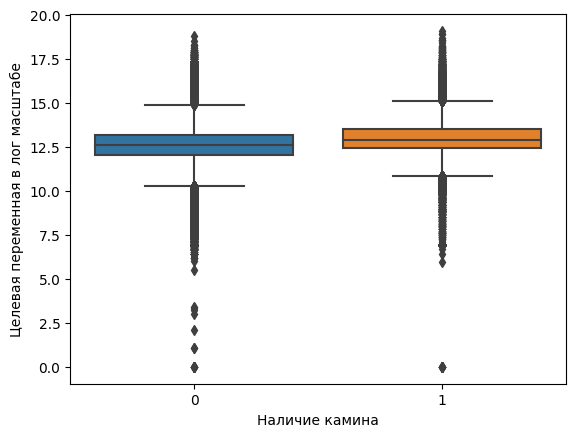

In [66]:
#визуализируем
boxplot3 = sns.boxplot(data=df_c, x="fireplace_booled", y="log_target_clean")
boxplot3.set_xlabel('Наличие камина')
boxplot3.set_ylabel('Целевая переменная в лог масштабе')
;

In [67]:
#посмотрим распределения, в тыс долларах
round(df_c['target_clean'].groupby(df_c['fireplace_booled']).describe()/1000,2)

,count,mean,std,min,25%,50%,75%,max
fireplace_booled,,,,,,,,
0,274.52,583.27,1621.34,0.0,165.0,294.37,525.00,150000.0
1,99.91,814.31,2334.55,0.0,250.0,399.90,726.75,195000.0


Не смотря на то, что визуально на графике существенных различий в группах не видно (тут скорее вопрос корректных масштабов)
В сгруппированных данных есть отличия в средних и медианных значения целевой переменной (при наличие камина показатели выше)

In [68]:
#удалим избыточные столбцы
df_c = df_c.drop(['fireplace'], axis=1)

In [71]:
#пересохранимся
df_cl = df_c.copy()
df_cl.to_csv('output\df_cl.csv') 



In [211]:
#читаем предобработанный файл
df_cl = pd.read_csv('output\df_cl.csv') 

In [74]:
#проведем анализ и очистку признака stories
#количество и доля пропусков
print('Количество пропусков', df_cl['stories'].isna().sum())
print('Доля пропусков',round(df_cl['stories'].isna().sum()/len(df_cl),3))

print('____________')

#заменим пропуски на NA
df_cl['stories'] = df_cl['stories'].fillna('NA')

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_cl['stories'].str.findall('[^0-9]'))
print(simbols.value_counts())

Количество пропусков 149535
Доля пропусков 0.399
____________
stories
[.]                               154459
[N, A]                            149535
[]                                 51917
[O, n, e]                           5758
[ , S, t, o, r, y]                  3470
                                   ...  
[Q, u, a, d,  , L, e, v, e, l]         1
[A,  , F, r, a, m, e]                  1
[T, u, d, o, r]                        1
[H, i, l, l, s, i, d, e]               1
[P, a, t, i, o,  , H, o, m, e]         1
Name: count, Length: 150, dtype: int64


В промежуточных итерациях предприняла несколько попыток в очистке и обработке данного признака, но все они не имели удовлетворительных результатов, поэтому приняла решение об исключении данного признака, в том числе в связи с высокой доле пропусков - 40%

In [75]:
#проведем анализ и очистку признака zipcode
#количество и доля пропусков
print('Количество пропусков', df_cl['zipcode'].isna().sum())
print('Доля пропусков',df_cl['zipcode'].isna().sum()/len(df_cl))

print('____________')

#посмотрим какая информация  присутствует в  поле,
display(df_cl['zipcode'].value_counts().head(5))
display(df_cl['zipcode'].value_counts().tail(5))

Количество пропусков 0
Доля пропусков 0.0
____________


zipcode
32137    2138
33131    1561
34747    1488
78245    1383
34759    1332
Name: count, dtype: int64

zipcode
27707-4206    1
41831         1
61736         1
27615-1459    1
44704         1
Name: count, dtype: int64

Пропусков в поле нет, однако встречаются коды длиной в 5 значений, и в 9 значений (5-4 значения). Изучим эту тему, вот что нашла в интернете:
Is a ZIP Code 5 or 9 digits?
A 5-Digit ZIP code represents a USPS delivery area.
A 9-Digit ZIP code, also known as a ZIP+4 code or an extended ZIP code, includes the same information as the 5-Digit ZIP code, plus additional information about a specific delivery route within the delivery area.

Таким образом, приведем поле к единому формату в 5 значений

In [77]:
#избавимся от возможных избыточных пробелом 
df_cl['zipcode'] = df_cl['zipcode'].str.strip().replace(' ','').replace('\t', ' ').replace('\n', '')

#создадим поле маркер длины поля индекса
df_cl['zip_len'] = df_cl['zipcode'].str.len()
df_cl['zip_len'].value_counts()

zip_len
5     372288
4       1897
10       238
1          3
6          3
2          2
8          1
9          1
Name: count, dtype: int64

In [78]:
df_cl[(df_cl['zip_len'] >5) & (df_cl['zip_len'] <10) | (df_cl['zip_len'] <4) ][['street', 'state', 'city', 'zipcode','zip_len']].sort_values(by = 'zip_len')

,street,state,city,zipcode,zip_len
30261,Gates Canyon Rd,CA,Vacaville,0,1
83522,Cornejo Ricardo Descalzi,NY,Quito Ecuador,0,1
305572,000 U.S. Hwy 359,TX,Laredo,0,1
231282,0 N Gopher Canyon Rd,CA,Bonsall,--,2
235207,1744 N Dixie Hwy # 1744,FL,Fort Lauderdale,--,2
85581,6789 White River Home,NY,Other City Value - Out Of Area,123456,6
133901,2315 Gerritsen Ave Unit 3A,NY,Brooklyn,112229,6
161389,301 Altara #402,FL,Coral Gables,331446,6
112513,1307 Formal Garden Way,NC,Raleigh,27603-43,8
242855,132 Edward Booth Ln,NC,Durham,27713-967,9


In [79]:
#проведем замены данные с сайта https://www.unitedstateszipcodes.org/
#zip len 1
df_cl.loc[30065,'zipcode'] = '95688'
df_cl.loc[303553,'zipcode'] = '78043' #https://www.bhgre.com/tx/laredo/u-south-texas-359/lid-P00800000GY672KJz7mNzTVtKNKhvyAXJLD9xIHX
#zip len 2
df_cl.loc[229754,'zipcode'] = '92003'
df_cl.loc[233641,'zipcode'] = '33305'
#zip len 6
df_cl.loc[85027,'zipcode'] = '48039' #https://www.realtor.com/realestateandhomes-detail/6789-River-Rd_Cottrellville_MI_48039_M35054-26886
df_cl.loc[133024,'zipcode'] = '11229'
df_cl.loc[160330,'zipcode'] = '32086'
#zip len 8
df_cl.loc[111769,'zipcode'] = '27603'
#zip len 9
df_cl.loc[241237,'zipcode'] = '27713'

In [80]:
#zip len 1 df_cl.loc[82977,'zipcode'] 
#находится в эквадоре, удалю данное наблюдение
display(df_cl.loc[82977])
df_cl =df_cl.drop (index= 82977 )

status                                                             NaN
propertyType                                             Single Family
street                                                   3609 Marco Dr
homeFacts            {'atAGlanceFacts': [{'factValue': '1963', 'fac...
city                                                             Tampa
schools              [{'rating': ['3/10', '2/10', '4/10'], 'data': ...
zipcode                                                          33614
state                                                               FL
stories                                                              0
target                                                        $302,704
target_clean                                                  302704.0
log_target_clean                                             12.620511
private_pool_join                                                    1
mlsid_join                                                          NA
mlsid_

In [81]:
#также удалю наблюдение с индексом 00000
display(df_cl.loc[306187])
df_cl =df_cl.drop (index= 306187 )

status                                                     foreclosure
propertyType                                                     condo
street                                        8550 SW 109th Ave #5-202
homeFacts            {'atAGlanceFacts': [{'factValue': '1969', 'fac...
city                                                             Miami
schools              [{'rating': ['6/10', '4/10', '10/10', '10/10',...
zipcode                                                          33173
state                                                               FL
stories                                                            2.0
target                                                        $178,953
target_clean                                                  178953.0
log_target_clean                                             12.094878
private_pool_join                                                    1
mlsid_join                                                          NA
mlsid_

In [82]:
#обработаем наблюдения с zip len 10 взяв только первые 5 цифр из них, зная, что они имеют 
df_cl['zipcode'] = df_cl['zipcode'].str[:5]

На этом обработка закончена, я не обрабатываю индексы длиной 4 символа, что с ними делать дальше уточню по ходу проекта

In [84]:
# с помощью библиотеки  uszipcode по почтовому индексу, выведем информацию о широте, 
# долготе, основному городу применения индекса, количеству жителей по данному индексу и прочих важных особенностях

def get_info_from_zipcode (x):

    engine = SearchEngine()
    try:
        zipcode = engine.by_zipcode(x)
        
        major_city = zipcode.major_city #основной город
        population = zipcode.population #количество жителей
        lat = zipcode.lat #широта
        lng = zipcode.lng #долгота
        state = zipcode.state #штат
        median_household_income = zipcode.median_household_income #медианный доход домохозяйств
        occupied_housing_units = zipcode.occupied_housing_units #количество занятых жилых помещений
        housing_units = zipcode.housing_units #количество жилых помещений
        return major_city,population,lat,lng,state,median_household_income, housing_units, occupied_housing_units
    except: return 'NA'

In [85]:
#применим функцию
df_cl['location'] = df_cl['zipcode'].apply(get_info_from_zipcode)
df_cl['location'].head(3)

#обработка занимает около 20 мин!

0    (Southern Pines, 13921, 35.18, -79.4, NC, 4798...
1    (Spokane, 24362, 47.69, -117.19, WA, 45098, 10...
2    (Los Angeles, 35482, 34.08, -118.49, CA, 11085...
Name: location, dtype: object

In [86]:
#посмотрим, что отработало с ошибкой
df_cl[df_cl['location'] == 'NA'][['city','state', 'street', 'location', 'zipcode']]
# cогласно https://www.unitedstateszipcodes.org/ таких индексов действительно нет. удалю данные

,city,state,street,location,zipcode
24403,Seattle,WA,2401 8th Ave N #202,NA,90109
30261,Vacaville,CA,Gates Canyon Rd,NA,0
50596,Miami Gardens,FL,21005 NW 14th Place 346 # 3,NA,3316
76370,Lakewood,WA,442 Lake Louise Dr SW,NA,98489
83522,Quito Ecuador,NY,Cornejo Ricardo Descalzi,NA,0
99909,Huntington,VT,181 Huntington Acres Rd,NA,05642
104961,Key Biscayne,FL,141 Crandon Blvd #345,NA,33249
111316,San Antonio,TX,Ber Mar LOT 88,NA,78697
181900,Durham,NC,1203 Fitchie Pl,NA,22703
204239,Miami,FL,80 SW 177 Ave,NA,33000


In [88]:
#посмотрим, что произошло с кейсами где индекс состоит из 4 символов
df_cl[df_cl['zip_len'] == 4][['city','state', 'street', 'location', 'zipcode']]

# а большинство кейсов с 4 символами определились. 

,city,state,street,location,zipcode
69,Lakewood,NJ,26 Casco Ct,"(Lakewood, 92843, 40.09, -74.21, NJ, 40240, 26...",8701
78,Boston,MA,340 W 2nd St #4,"(South Boston, 31799, 42.33, -71.04, MA, 68724...",2127
129,Worcester,MA,9 Ridge St,"(Worcester, 34677, 42.25, -71.77, MA, 49797, 1...",1604
344,Swanton,VT,15 Glen Ridge Ln,"(Swanton, 7690, 44.92, -73.12, VT, 52026, 3763...",5488
410,Charlotte,VT,Morningside Dr Lot 2,"(Charlotte, 3754, 44.3, -73.25, VT, 110344, 17...",5445
...,...,...,...,...,...
376823,Essex,VT,83 Center Rd Unit 81A,"(Essex Junction, 19710, 44.49, -73.11, VT, 760...",5452
376870,Fairfield Twp,NJ,253 Horseneck Rd,"(Fairfield, 7440, 40.88, -74.3, NJ, 97115, 271...",7004
377013,Boston,MA,133 Seaport Blvd #1701,"(Boston, 2090, 42.35, -71.04, MA, 110333, 1358...",2210
377062,Lakewood,NJ,4 Olympic Cir,"(Lakewood, 92843, 40.09, -74.21, NJ, 40240, 26...",8701


In [94]:
#разобъем полученные данные на столбцы
df_cl[['major_city', 'population', 'lat ','lng' ,
       'state_zip' ,'median_household_income', 
       'housing_units', 'occupied_housing_units']] = pd.DataFrame(df_cl['location'].tolist(), index=df_cl.index)

In [95]:
#удалим наблюдения с пустыми данными
print(df_cl.shape)
df_cl = df_cl[df_cl['location'] != 'NA']
print(df_cl.shape)


(374431, 29)
(374410, 29)


Так как я обогатила данные информацией по индексу, я удалю и не буду обрабатывать следующие признаки
-street
-city
-state

In [96]:
#удалим вспомогательные колонки, 
#zip_len, location 
df_cl = df_cl.drop( ['zip_len', 'location'], axis=1)
#а также те колонки, которые не буду обрабатывать
df_cl = df_cl.drop( ['street', 'city', 'state'], axis=1)

Text(0.5, 1.0, 'occupied_housing_units')

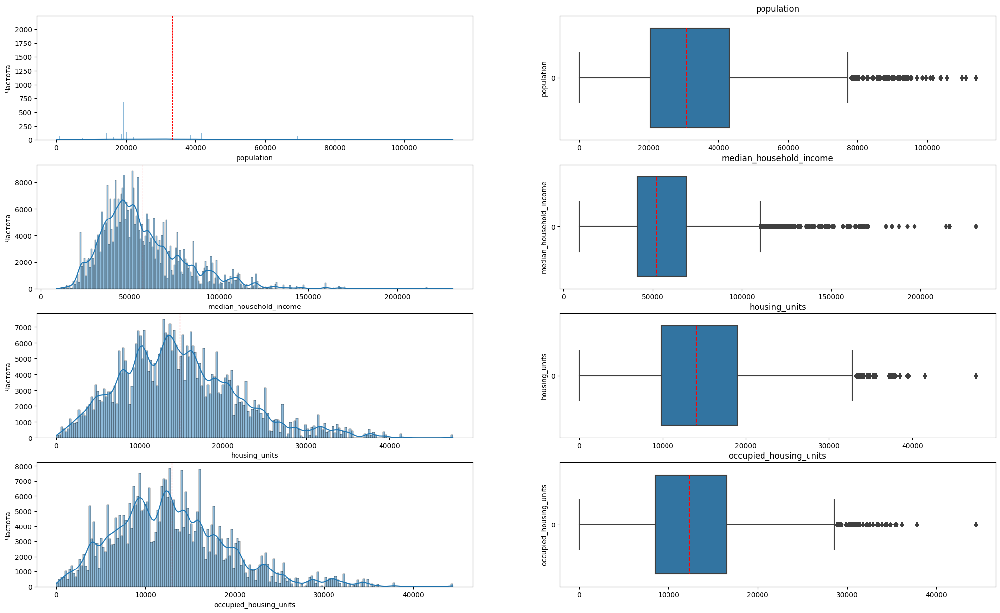

In [102]:
#визуализируем распределения числовых  добавленных признаков

fig, axes = plt.subplots(4, 2, figsize=(25, 15))

histplot1 = sns.histplot(df_cl['population'], kde=True, ax=axes[0,0])
histplot1.set(xlabel='population', ylabel='Частота')
histplot1.axvline(df_cl['population'].mean(), color='red', linestyle='--', linewidth=0.8)
boxplot1 = sns.boxplot(df_cl['population'], ax=axes[0,1], orient='h', medianprops={"color": "red", "linestyle": '--'})
boxplot1.set(ylabel='population')
boxplot1.set_title('population')


histplot2 = sns.histplot(df_cl['median_household_income'], kde=True, ax=axes[1,0])
histplot2.set(xlabel='median_household_income', ylabel='Частота')
histplot2.axvline(df_cl['median_household_income'].mean(), color='red', linestyle='--', linewidth=0.8)
boxplot2 = sns.boxplot(df_cl['median_household_income'], ax=axes[1,1], orient='h', medianprops={"color": "red", "linestyle": '--'})
boxplot2.set(ylabel='median_household_income')
boxplot2.set_title('median_household_income')


histplot3 = sns.histplot(df_cl['housing_units'], kde=True, ax=axes[2,0])
histplot3.set(xlabel='housing_units', ylabel='Частота')
histplot3.axvline(df_cl['housing_units'].mean(), color='red', linestyle='--', linewidth=0.8)
boxplot3 = sns.boxplot(df_cl['housing_units'], ax=axes[2,1], orient='h', medianprops={"color": "red", "linestyle": '--'})
boxplot3.set(ylabel='housing_units')
boxplot3.set_title('housing_units')


histplot3 = sns.histplot(df_cl['occupied_housing_units'], kde=True, ax=axes[3,0])
histplot3.set(xlabel='occupied_housing_units', ylabel='Частота')
histplot3.axvline(df_cl['occupied_housing_units'].mean(), color='red', linestyle='--', linewidth=0.8)
boxplot3 = sns.boxplot(df_cl['occupied_housing_units'], ax=axes[3,1], orient='h', medianprops={"color": "red", "linestyle": '--'})
boxplot3.set(ylabel='occupied_housing_units')
boxplot3.set_title('occupied_housing_units')

In [ ]:
histplot1 = sns.histplot(df_cl['population'], kde=True, ax=axes[0,0])
histplot1.set(xlabel='population', ylabel='Частота')
histplot1.axvline(df_cl['population'].mean(), color='red', linestyle='--', linewidth=0.8)
boxplot1 = sns.boxplot(df_cl['population'], ax=axes[0,1], orient='h', medianprops={"color": "red", "linestyle": '--'})
boxplot1.set(ylabel='population')
boxplot1.set_title('population')

In [ ]:
box.xticks(rotation=70)
box.tight_layout()
box.set(xlabel='Штат', ylabel='Среднее по целевой переменной')

In [245]:
#cоздадим признак, который будет выводить только первые 25 по популярности городов, а остальные отправим в группу "others"
df_cl['major_city'].value_counts().head(25).to_dict().keys()
df_cl['major_city_ch'] = df_cl['major_city'].apply(lambda x: 'others' if x not in ['Houston', 'Miami', 'San Antonio', 'Fort Lauderdale', 'Jacksonville', 'Dallas', 'Cleveland', 'Brooklyn', 
                                                                                   'Orlando', 'New York', 'Chicago', 'Charlotte', 'Tampa', 'Las Vegas', 
                                                                                   'Fort Worth', 'Kissimmee', 'Austin', 'Saint Petersburg', 'Atlanta',
                                                                                   'Nashville', 'Seattle', 'Philadelphia', 'Washington', 'Los Angeles', 'Miami Beach'] else x)

''

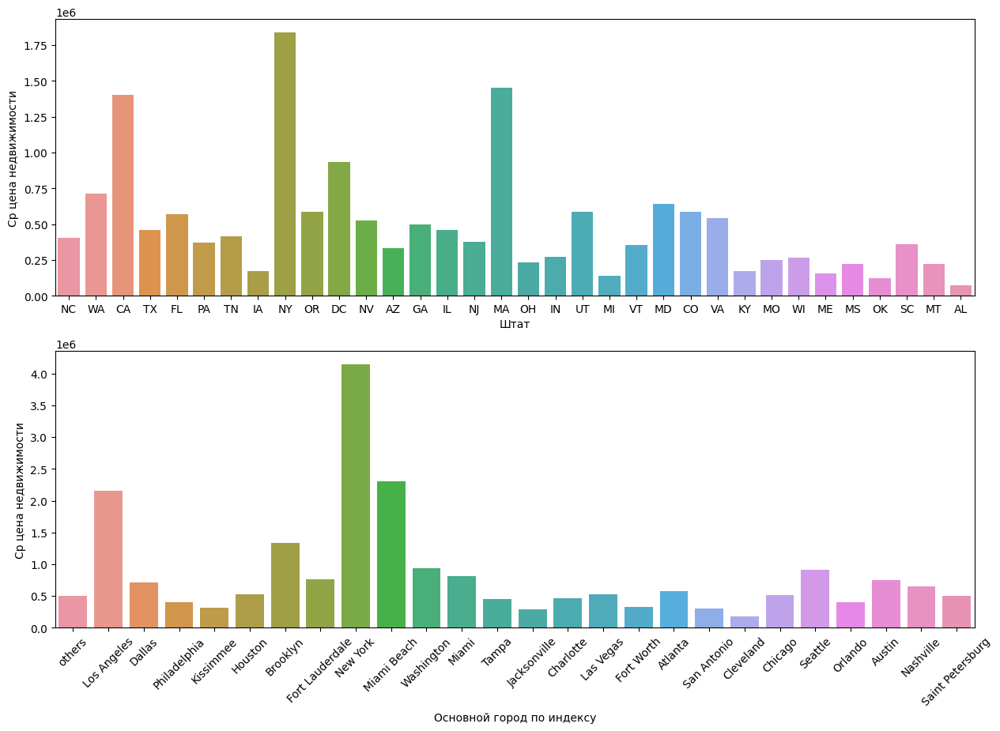

In [246]:
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

box = sns.barplot(x='state_zip', y='target_clean', data=df_cl, estimator='mean', errorbar=None, ax=axes[0])
box.set(xlabel='Штат', ylabel='Ср цена недвижимости')

box2 = sns.barplot(x='major_city_ch', y='target_clean', data=df_cl, estimator='mean', errorbar=None, ax=axes[1])
box2.set(xlabel='Основной город по индексу', ylabel='Ср цена недвижимости')
box2.set_xticklabels(box2.get_xticklabels(), rotation=45)
;

В штатах NY, MA, СA  (Нью-Йорк,Массачусетс, Калифорния) самые высокие средние цены на недвижимость
Города, ожидаемо: Нью-Йорк, Лос Анджелес, иии самые высокие цены в Форт Даундейл

из википедии: Форт Даундейл курортный город на восточном побережье южной Флориды, расположенный между городами Майами и Уэст-Палм-Бич. Население — 165 521 чел (2010)[2]. История этого города связана с именем первопроходца Уильяма Кули. В городе расположена штаб-квартира компании AutoNation — крупнейшего в США продавца автомобилей. Город является популярным туристическим объектом, в 2006 году его посетили 10,35 миллиона человек[3]. Форт-Лодердейл иногда называют «Американской Венецией»[4].
Непосредственная близость Форт-Лодердейл к Атлантическому океану, прекрасная природа, разнообразный подводный мир и удобные природные бухты делают этот город популярным местом для занятия яхтингом.
Высокий уровень яхтенной инфраструктуры способствовал тому, что это место стало центром проведения всемирно известного рождественского парада яхт и выставки яхт и катеров — Fort Lauderdale International Boat Show.
Парад традиционно проводится 14 декабря. Его история насчитывает несколько десятков лет. Он ежегодно проводится, начиная с 1971 года, и каждый раз имеет свою тематику.
Выставка яхт проводится ежегодно, начиная с 1960 года, и является одним из самых масштабных мероприятий в этой отрасли.

Так что думаю, это не случайность, что недвижимость Форт Даундейле дорогая)

In [247]:
#пересохранимся
df_cle = df_cl.copy()
df_cle.to_csv('output\df_cle.csv') 

In [248]:
#читаем предобработанный файл
df_cle = pd.read_csv('output\df_cle.csv') 

In [250]:
#предположительно поле со статусом объекта недвижимости будет играть важную роль, поэтому поработаем над ним 

#количество и доля пропусков
print('Количество пропусков', df_cle['status'].isna().sum())
print('Доля пропусков',round(df_cle['status'].isna().sum()/len(df_cle),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_cle['status'].str.lower().replace('  ', ' ').nunique())

Количество пропусков 39124
Доля пропусков 0.104
______________
Количество уникальных значений 149


In [251]:
#заменим пропуски на 'not defined'
df_cle['status'] = df_cle['status'].fillna('not defined').str.lower()

#посмотрим на самые популярные значения
df_cle['status'].str.lower().value_counts().nlargest(25)

status
for sale                             199508
active                               105112
not defined                           39124
foreclosure                            6019
new construction                       5457
pending                                4800
pre-foreclosure                        2000
p                                      1488
pre-foreclosure / auction              1281
under contract show                    1183
 / auction                              799
under contract   showing                792
active under contract                   718
under contract                          691
new                                     689
contingent                              581
price change                            563
auction                                 493
a active                                443
for rent                                398
foreclosed                              294
under contract backups                  252
contingent finance and in

Данную переменную будем обрабатывать таким образом, чтобы сформировались логичные категории, предлагаю следующую разбивку:


active -активен - 'active', 'a active',  're activated', 'reactivated', 'back on market','temporary active', 'active option','active backup', 'active with offer', а также самый популярный статус 'for sale' войдет в эту категорию

foreclosure - объекты продающиеся в связи с неуплатой ипотечного займа - 'pre-foreclosure / auction','pre-foreclosure','foreclosure','foreclosed', 'contingent   foreclosure'

auction - объект реализуется на базе аукциона -  / auction', 'auction', 'auction - active', 'active - auction'

under contract - объект с предложением о покупке - 'under contract','under contract   showing','under contract backups','active under contract','under contract show','contract p','backup contract','option contract','active option contract','contract contingent on buyer sale','u under contract','under contract - show', 'contingency contract', 'under contract - no show', 'contract', 'conditional contract','active with contract', 'under contract w/ bckp', 'under contract taking back up offers', 'c continue show'


contingent - актив, с некими доп обстоятельствами (все кейсы, которые содержат данную формулировку и не попали в ранее указанные типы - 'active/contingent',
'contingent','contingent finance and inspection','active with contingencies','contingent show','contingent take backup','contingent   show','contract contingent on buyer sale','active contingency','pending with contingencies','contingent lien holder release','contingency contract','contingent escape','active contingent','ct insp - inspection contingency','contingency 48 hr (+/ )','contingent   release','active - contingent','contingent   no show','conting accpt backups','contingent - sale of home','contingent - financing')


for rent - объект под сдачу в аренду - 'for rent', 'apartment for rent', 'condo for rent', lease/purchase

pending- в ожидании чего-либо (все кейсы, которые содеражт данную формулировку и не вошедшие в предыдущие группы)

not defined - статус неизвестен - информация с пропусками,а также  'p',  'c', 'pi', 'ct', 'pf', 'ps'

new construction - также оставим данную категорию строящегося жилья

other - прочие минорные статусы - listing extended, due diligence period, closed, accepted offer, accepting backups, conting accpt backups, backup, price change 
    + coming - объект не в наличие - все типы объектов с комментарием 'coming soon: .....'


In [252]:
#создадим маски, которые будут помогать нам обработать данную категориальную переменную

mask1 = list(df_cle['status'][df_cle['status'].str.contains('coming')].unique()) 
mask2 = list(df_cle['status'][df_cle['status'].str.contains('forec')].unique())
mask3 = list(df_cle['status'][df_cle['status'].str.contains('auc')].unique())
mask4 = list(df_cle['status'][df_cle['status'].str.contains('contra')].unique())
mask5 = list(df_cle['status'][df_cle['status'].str.contains('continge')].unique())
mask6 = list(df_cle['status'][df_cle['status'].str.contains('rent')].unique())
mask7 = list(df_cle['status'][df_cle['status'].str.contains('pending')].unique())

In [253]:
#протипируем категории
df_cle['status_cl'] =df_cle['status'].str.lower().apply(lambda x: 'active' if x in ['active', 'a active',  're activated', 'reactivated', 'back on market',
                                                                                'temporary active', 'active option','active backup', 'for sale', 'active with offer', 'new'] else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'coming' if x in mask1 else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'foreclosure' if x in mask2 else x)


df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'auction' if x in mask3 else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'under contract' if x in mask4 or x == 'c continue show' or x == 'uc continue to show' else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'contingent' if x in mask5 else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'for rent' if x in mask6 or x =='lease/purchase' else x)
df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'pending' if x in mask7 else x)

df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'not defined' if x in ['p',  'c', 'pi', 'ct', 'pf', 'ps'] else x)

df_cle['status_cl'] =df_cle['status_cl'].apply(lambda x: 'others' if x in [ 'listing extended', 'due diligence period', 'closed', 'accepted offer', 
                                                                       'accepting backups', 'conting accpt backups',  'backup', 'price change', 'coming' ] else x)

In [254]:
df_cle['status_cl'].value_counts()

status_cl
active              305963
not defined          40698
foreclosure           9596
new construction      5457
pending               5313
under contract        3820
auction               1330
contingent            1079
others                 741
for rent               413
Name: count, dtype: int64

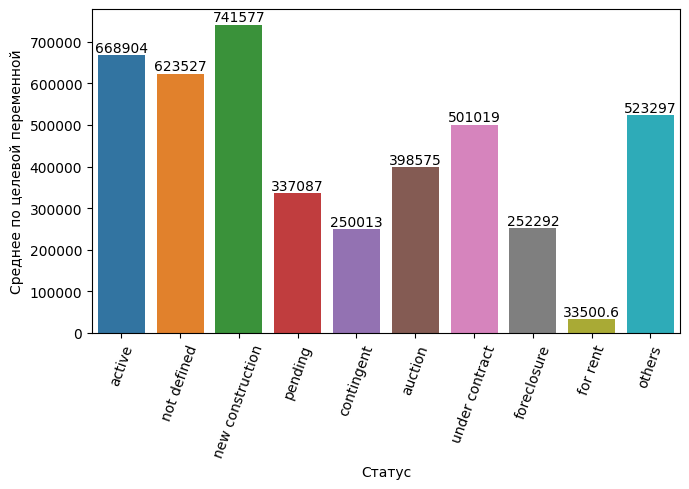

In [255]:
fig, ax = plt.subplots(figsize=(7,5))
fig = sns.barplot(x='status_cl', y='target_clean', data=df_cle, estimator='mean', errorbar=None)
plt.xticks(rotation=70)
plt.tight_layout()
ax.set_xlabel("Статус")
ax.set_ylabel("Среднее по целевой переменной")
ax.bar_label(ax.containers[0]);

Некоторые выводы по итогам формирования категорий:
категория - победитель по средним ценам - это объекты категории "under construction"
категории, определяющие некоторые обстоятельства/проблемы/ сложности - "pending", "contingent", "foreclosure" - имеют существенно более низкие цены
категория - for rent - имеет минимальную среднюю цену, тк мы уже ранее смотрели - скорее всего речь идет о цене за месяц, а не о цене покупки. поэтому цены минимальны
по категории 'auction' - скорее всего отражается цена старта аукциона, которая будет расти в зависимости от заинтересованности в данном объекте

In [256]:
#удалим избыточные столбцы
df_cle = df_cle.drop(['status'], axis=1)

In [257]:
#изучим и поработаем с полем propertyType

#количество и доля пропусков
print('Количество пропусков', df_cle['propertyType'].isna().sum())
print('Доля пропусков',round(df_cle['propertyType'].isna().sum()/len(df_cle),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_cle['propertyType'].str.lower().nunique())

Количество пропусков 34410
Доля пропусков 0.092
______________
Количество уникальных значений 1271


Cудя по внешнему виду данных, фактически тип недвижимости отражен в 1ом значении списка, список разделен запятыми.
Поэтому исходя из этого предположения, сохраним только 1ое значение в списке и далее будем обрабатывать его.

Также еще до обработки можно выделить несколько самых основных категорий:
-single-family
-condo
-land
-multi-family
-coop

In [258]:
df_cle['propertyType'].str.lower().value_counts().head(15)

propertyType
single-family home               91369
single family                    61885
condo                            42366
single family home               31687
lot/land                         20496
townhouse                        18342
land                             10897
multi-family                      7895
condo/townhome/row home/co-op     7697
traditional                       5912
coop                              3264
multi family                      2771
high rise                         1823
ranch                             1781
detached, one story               1614
Name: count, dtype: int64

In [259]:
#обработаем некоторые c заполнением поля проблемы

df_cle['propertyType_cl'] = df_cle['propertyType'].str.lower().replace(" ']", '').str.replace('[', '').str.replace("' ", '').str.replace(" '", '').str.replace('/',' ').str.replace('(','').str.replace(')','')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.strip()


#обработаем некоторые замеченные ранее ошибки и разные написания слов
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('mo2 le','mobile').replace('mo2le','mobile')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('ca2 n','cabin').replace('ca2n','cabin')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('mid-century','midcentury').replace('mid century','midcentury')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('condominium','condo')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('cooperative','coop').replace('co-op','coop')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('single family home','single-family').replace('single-family home','single-family').replace('single detached','single-family').replace('singlefamilyresidence','single-family')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('single family','single-family').replace('detached','single-family')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('multi-family home','multi-family').replace('multi family','multi-family')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('lot land','land')
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].str.replace('unknown','na').replace('yes','na').replace('other see remarks','na')

#заменим пропуски на 'na'
df_cle['propertyType_cl'] = df_cle['propertyType_cl'].fillna('na').str.lower()

df_cle['propertyType_cl'].nunique()

1258

In [260]:
#как и говорили выше, выведем 1ый элемент списка в отдельную колонку и будем обрабатывать его:
df_cle['property_type_f'] = df_cle['propertyType_cl'].str.split(', ').str[0]

print('Количество уникальных значений после обработки',df_cle['property_type_f'].nunique())

Количество уникальных значений после обработки 249


In [261]:
df_cle['property_type_f'].value_counts().head(10)

property_type_f
single-family                    185952
condo                             42423
na                                34551
land                              31393
townhouse                         18479
multi-family                      12166
condo townhome row home co-op      7697
traditional                        6072
coop                               3834
detached                           2589
Name: count, dtype: int64

Теперь можно выделить некоторые типы недвижимости, к которым будем пытаться привести информацию. Как и ранее основными являются:
-single-family
-condo
-land
-multi-family
-coop
+townhouse
+mobile
+historical
+ranch
+traditional

In [262]:
#создадим маски для поиска 
mask1 = list(df_cle['property_type_f'][df_cle['property_type_f'].str.contains('condo')].unique())
mask2 = list(df_cle['property_type_f'][df_cle['property_type_f'].str.contains('mobile')].unique())
mask3 = list(df_cle['property_type_f'][df_cle['property_type_f'].str.contains('histor')].unique())
mask4 = list(df_cle['property_type_f'][df_cle['property_type_f'].str.contains('detached')].unique())
mask5 = list(df_cle['property_type_f'][df_cle['property_type_f'].str.contains('ranch')].unique())

In [263]:
#применим маски для типизации
df_cle['property_type_fin'] = df_cle['property_type_f'].apply(lambda x: 'condo' if x in mask1 else x)
df_cle['property_type_fin'] = df_cle['property_type_fin'].apply(lambda x: 'mobile' if x in mask2 or x == 'mobile home 1 story' else x)
df_cle['property_type_fin']  = df_cle['property_type_fin'].apply(lambda x: 'historical' if x in mask3 else x)
df_cle['property_type_fin']  = df_cle['property_type_fin'].apply(lambda x: 'single-family' if x in mask4 else x)
df_cle['property_type_fin'] = df_cle['property_type_fin'].apply(lambda x: 'single-family' if x in ['2 story', '1 story', 'two story', 'one story', '1 1 2 story',
                                                                        '3 story', '1 1 2 story with basement', '1 story with basement','2-story','2.5 story',
                                                                        '2 stories','2 stories with basement'] else x)

df_cle['property_type_fin']  = df_cle['property_type_fin'].apply(lambda x: 'ranch' if x in mask5 else x)

df_cle['property_type_fin']  = df_cle['property_type_fin'].apply(lambda x: 'others' if x not in [ 'single-family', 'condo', 'na', 'land', 
                                                                       'townhouse', 'multi-family', 'traditional', 'coop', 'mobile', 'ranch' ] else x)

Итого на обработанные категорим приходится: 96 % , Остальные типы отнесем к типу "прочие", таким образом сформированы следующие типы:

In [264]:
df_cle['property_type_fin'].value_counts()

property_type_fin
single-family    195661
condo             51283
na                34551
land              31393
townhouse         18479
others            14985
multi-family      12166
traditional        6072
coop               3834
mobile             3468
ranch              2518
Name: count, dtype: int64

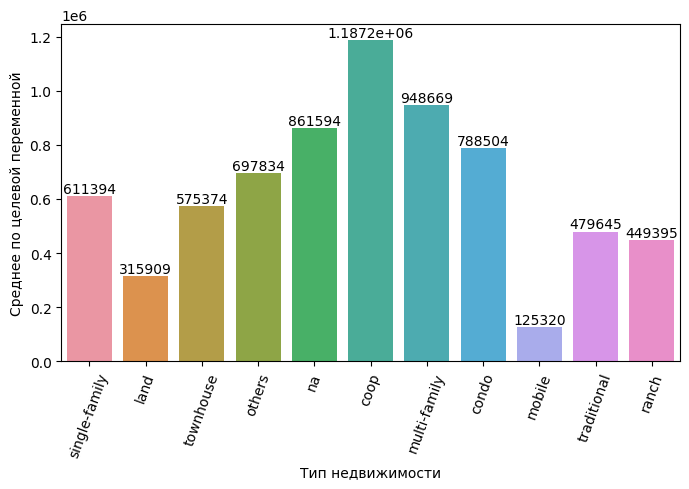

In [265]:
fig, ax = plt.subplots(figsize=(7,5))
fig = sns.barplot(x='property_type_fin', y='target_clean', data=df_cle, estimator='mean', errorbar=None)
plt.xticks(rotation=70)
plt.tight_layout()
ax.set_xlabel("Тип недвижимости")
ax.set_ylabel("Среднее по целевой переменной")
ax.bar_label(ax.containers[0]);

In [266]:
df_cle.columns

Index(['Unnamed: 0', 'propertyType', 'homeFacts', 'schools', 'zipcode',
       'stories', 'target', 'target_clean', 'log_target_clean',
       'private_pool_join', 'mlsid_join', 'mlsid_join_bool', 'sqft_clean',
       'log_sqft_clean', 'baths_clean', 'fireplace_booled', 'major_city',
       'population', 'lat ', 'lng', 'state_zip', 'median_household_income',
       'housing_units', 'occupied_housing_units', 'major_city_ch', 'status_cl',
       'propertyType_cl', 'property_type_f', 'property_type_fin'],
      dtype='object')

In [267]:
#удалим избыточные столбцы
df_cle = df_cle.drop(['propertyType_cl', 'property_type_f', 'propertyType'], axis=1)

In [268]:
#изучим и поработаем с полем homeFacts

#количество и доля пропусков
print('Количество пропусков', df_cle['homeFacts'].isna().sum())
print('Доля пропусков',round(df_cle['homeFacts'].isna().sum()/len(df_cle),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_cle['homeFacts'].str.lower().nunique())

Количество пропусков 0
Доля пропусков 0.0
______________
Количество уникальных значений 318397


In [269]:
#посмотрим, на признак 
df_cle.homeFacts[0]

"{'atAGlanceFacts': [{'factValue': '2019', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': 'Central A/C, Heat Pump', 'factLabel': 'Heating'}, {'factValue': '', 'factLabel': 'Cooling'}, {'factValue': '', 'factLabel': 'Parking'}, {'factValue': None, 'factLabel': 'lotsize'}, {'factValue': '$144', 'factLabel': 'Price/sqft'}]}"

В признаке зашифрован словарь, который содержит информацию о году постройки и обновленя, отоплении, охлаждении, парковке, размере объекта(участка),и цену за кв. фут.
созданим отдельные столбцы для каждого типа данных, однако, братт информацию о цену за кв. фут так как эта информация косвенно содержит данные о целевом признаке. 
При ее использовании произойдет утечка данных (data leak), что приведет к некачественной модели

In [270]:
#раскодируем словарь
df_cle['homeFacts'] = df_cle['homeFacts'].apply(eval)

In [271]:
#разобьем информацию по колонкам
df_cle['year_built'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][0]['factValue'])
df_cle['remodeled_year'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][1]['factValue'])
df_cle['heating'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][2]['factValue'])
df_cle['cooling'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][3]['factValue'])
df_cle['parking'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][4]['factValue'])
df_cle['lotsize'] = df_cle['homeFacts'].apply(lambda x: x['atAGlanceFacts'][5]['factValue'])


In [272]:
#пересохранимся
df_clea = df_cle.copy()
df_clea.to_csv('output\df_clea.csv') 

In [273]:
df_clea = pd.read_csv('output\df_clea.csv') 
df_clea.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374410 entries, 0 to 374409
Data columns (total 33 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Unnamed: 0.1             374410 non-null  int64  
 1   Unnamed: 0               374410 non-null  int64  
 2   homeFacts                374410 non-null  object 
 3   schools                  374410 non-null  object 
 4   zipcode                  374410 non-null  int64  
 5   stories                  224893 non-null  object 
 6   target                   374410 non-null  object 
 7   target_clean             374410 non-null  float64
 8   log_target_clean         374410 non-null  float64
 9   private_pool_join        374410 non-null  int64  
 10  mlsid_join               335007 non-null  object 
 11  mlsid_join_bool          374410 non-null  int64  
 12  sqft_clean               374410 non-null  int64  
 13  log_sqft_clean           374410 non-null  float64
 14  bath

In [274]:
#изучим и поработаем с полем year_built

#количество и доля пропусков
print('Количество пропусков', df_clea['year_built'].isna().sum())
print('Доля пропусков',round(df_clea['year_built'].isna().sum()/len(df_clea),3))
print("______________")

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_clea['year_built'].str.findall('[^0-9]'))
print(simbols.value_counts())

print("______________")
#количество уникальных значений
print('Количество уникальных значений', df_clea['year_built'].str.lower().nunique())

Количество пропусков 61828
Доля пропусков 0.165
______________
year_built
[]                       311401
[N, o,  , D, a, t, a]      1181
Name: count, dtype: int64
______________
Количество уникальных значений 227


In [275]:
# функция - попытка перевести значение в целое число
def clear_build(x):
    try:
        result = int(x)
    except:
        result = np.nan
    return result

# применим очистку
df_clea['facts_year_build'] = df_clea['year_built'].apply(clear_build)
df_clea['facts_year_build'].describe()

count    3.114010e+05
mean     3.598568e+06
std      1.419172e+09
min      1.000000e+00
25%      1.957000e+03
50%      1.985000e+03
75%      2.007000e+03
max      5.599906e+11
Name: facts_year_build, dtype: float64

In [276]:
#посмотрим на количество наблюдений с годом постройки старше 1990
df_clea[df_clea['facts_year_build']<1900]['facts_year_build'].value_counts().head(50)

facts_year_build
1890.0    744
1899.0    552
1880.0    322
1895.0    273
1885.0    146
1875.0    116
1870.0    114
1896.0    112
1898.0    105
1892.0     99
1893.0     66
1891.0     66
1894.0     66
1860.0     62
1850.0     62
1886.0     52
1889.0     51
1897.0     49
1888.0     45
1887.0     37
1865.0     34
1800.0     30
1883.0     23
1884.0     23
1877.0     20
1882.0     20
1881.0     16
1830.0     15
1876.0     15
1820.0     14
1873.0     14
1872.0     14
1868.0     14
1832.0     13
1840.0     13
1874.0     12
1869.0     12
1853.0     12
1854.0     11
1835.0     11
1864.0     10
1879.0     10
1866.0     10
1867.0      9
1878.0      9
1863.0      7
1842.0      6
1836.0      6
1862.0      6
1844.0      6
Name: count, dtype: int64

Предлагается исключить из выборки наблюдения с такими годами постройки. Дело в том, что очень старые, исторические объекты всегда оцениваются крайне индивидуально, 
и для модели будут скорее создавать шум. Удаляем их и, заодно, с датой постройки больше 2023 года тоже:

In [277]:
df_clea = df_clea[((df_clea['facts_year_build']>=1900) & (df_clea['facts_year_build']<=2023)) | (df_clea['facts_year_build'].isnull())]
print('Размер таблицы (строки) после удаления: {}'.format(df_clea.shape[0]))
print(df_clea['facts_year_build'].describe())

Размер таблицы (строки) после удаления: 370736
count    307727.000000
mean       1980.485099
std          32.050886
min        1900.000000
25%        1958.000000
50%        1986.000000
75%        2007.000000
max        2022.000000
Name: facts_year_build, dtype: float64


In [278]:
#на основе данного принака создадим признак с возрастом дома
max_fact_year_build = df_clea['facts_year_build'].max()
df_clea['home_age'] = max_fact_year_build - df_clea['facts_year_build']
df_clea['home_age'].describe()

count    307727.000000
mean         41.514901
std          32.050886
min           0.000000
25%          15.000000
50%          36.000000
75%          64.000000
max         122.000000
Name: home_age, dtype: float64

In [279]:
df_clea['home_age'] = df_clea['home_age'].fillna(df_clea['home_age'].median())
df_clea.loc[(df_clea['property_type_fin']=='land'), 'home_age'] = 0
print(df_clea['home_age'].describe())
print('Количество пропусков: ', df_clea['home_age'].isnull().sum())

count    370736.000000
mean         37.243313
std          31.071823
min           0.000000
25%          10.000000
50%          36.000000
75%          57.000000
max         122.000000
Name: home_age, dtype: float64
Количество пропусков:  0


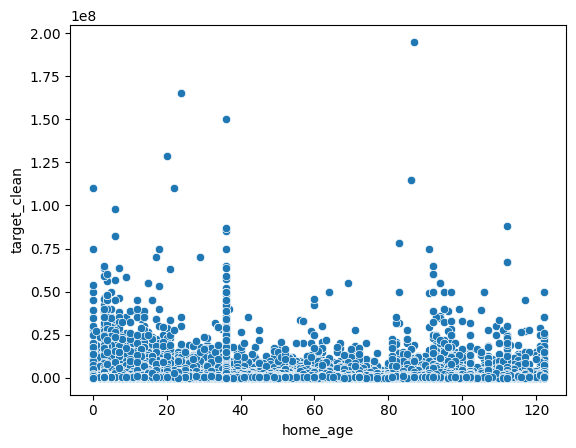

In [280]:
#визуализируем 
sns.scatterplot(data=df_clea, x="home_age", y="target_clean");

Судить о какой-то видимой зависимости пока не получается

In [281]:
#изучим и поработаем с полем remodeled_year

#количество и доля пропусков
print('Количество пропусков', df_clea['remodeled_year'].isna().sum())
print('Доля пропусков',round(df_clea['remodeled_year'].isna().sum()/len(df_clea),3))
print("______________")


#количество уникальных значений
print('Количество уникальных значений', df_clea['remodeled_year'].describe())

Количество пропусков 222133
Доля пропусков 0.599
______________
Количество уникальных значений count    148603.000000
mean       1979.426519
std          87.329647
min           0.000000
25%        1968.000000
50%        1986.000000
75%        2004.000000
max        2021.000000
Name: remodeled_year, dtype: float64


In [282]:
#cоздадим булевую переменную о наличие реставрации/кап ремонта
df_clea['remodeled_year_bool'] = df_clea['remodeled_year'].apply(lambda x:  0 if pd.isna(x) else 1)

''

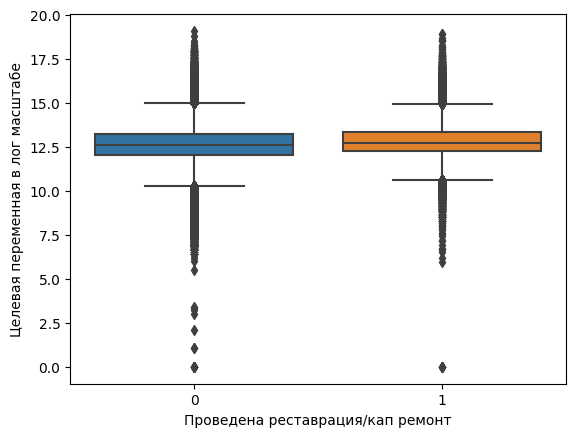

In [283]:
#визуализируем
boxplot5 = sns.boxplot(data=df_clea, x="remodeled_year_bool", y="log_target_clean")
boxplot5.set_xlabel('Проведена реставрация/кап ремонт')
boxplot5.set_ylabel('Целевая переменная в лог масштабе')
;

In [284]:
#посмотрим распределения, в тыс долларах
round(df_clea['target_clean'].groupby(df_clea['remodeled_year_bool']).describe()/1000,2)

,count,mean,std,min,25%,50%,75%,max
remodeled_year_bool,,,,,,,,
0,222.13,623.34,1864.94,0.0,169.9,306.3,550.0,195000.0
1,148.60,665.30,1761.45,0.0,209.9,339.9,619.0,165000.0


Каких-то ярковыраженных особенностей по данному признаку не наблюдается

In [285]:
#изучим и поработаем с полем lotsize

#количество и доля пропусков
print('Количество пропусков', df_clea['lotsize'].isna().sum())
print('Доля пропусков',round(df_clea['lotsize'].isna().sum()/len(df_clea),3))
print("______________")

#посмотрим какие символы присутствуют в целевом поле, кроме ожидаемых цифровых значений
simbols= (df_clea['lotsize'].str.findall('[^0-9]'))
print(simbols.value_counts())

print("______________")
#количество уникальных значений
print('Количество уникальных значений', df_clea['lotsize'].str.lower().nunique())

Количество пропусков 60383
Доля пропусков 0.163
______________
lotsize
[,,  , s, q, f, t]                      97826
[.,  , a, c, r, e, s]                   56912
[]                                      42931
[,,  , S, q, .,  , F, t, .]             27111
[—]                                     25119
[ , s, q, f, t]                         19571
[.,  , A, c, r, e, s]                   12182
[,,  , s, q, f, t,  , l, o, t]          10840
[.,  , a, c, r, e, s,  , l, o, t]        5353
[N, o,  , D, a, t, a]                    5282
[-, -,  , s, q, f, t,  , l, o, t]        3796
[ , a, c, r, e]                           769
[ , A, c, r, e]                           569
[ , s, q, f, t,  , l, o, t]               459
[.]                                       383
[ , S, q, .,  , F, t, .]                  373
[ , a, c, r, e, s]                        241
[ , A, c, r, e, s]                        235
[ , a, c, r, e,  , l, o, t]               140
[ , a, c, r, e, s,  , l, o, t]            130
[,]      

Пока пропустим данный признак,  в случае необходимости, вернусь к его обработке

In [286]:
#изучим и поработаем с полем heating

#количество и доля пропусков
print('Количество пропусков', df_clea['heating'].isna().sum())
print('Доля пропусков',round(df_clea['heating'].isna().sum()/len(df_clea),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_clea['heating'].str.lower().nunique())

Количество пропусков 107797
Доля пропусков 0.291
______________
Количество уникальных значений 1871


Так как доля пропусков достаточно сущесвенная, предлагаю достаточно грубо обработать признак, выделив следующие категории:
-воздушная система отопления - air 
-газовое отопление
-электрическое отопление
-прочие типы отопления
-отопление не требуется (если это земля)
-нет данных

In [287]:
# функция для определения системы отопления
def get_heating(fact_heat, obj_type):
    
# для участка земли отоление не нужно
    if obj_type == 'land':
        return 'NO HEATING NEED'
    
# если не указано - возвращаем 'NO DATA'
    if fact_heat != fact_heat:
        return 'NO DATA'
    fact_heat = str(fact_heat)
    result = []
    heating = ['AIR','GAS','ELECTRIC','NO DATA']
    
# в остальных случаях ищем значения из списка видов отопления heating
    for val in heating:
        if val in fact_heat:
            result.append(val)
    if len(result)==0:
        return 'OTHER'
    if len(result)>1:
        return 'MULTI'
    return result[0]

# применяем функцию
df_clea['heating'] = df_clea['heating'].str.upper()
df_clea['heating_system'] = df_clea.apply(lambda x: get_heating(x['heating'], x['property_type_fin']), axis = 1)
df_clea['heating_system'].value_counts()

heating_system
AIR                145993
NO DATA             91670
OTHER               60527
NO HEATING NEED     31251
ELECTRIC            25081
GAS                 11531
MULTI                4683
Name: count, dtype: int64

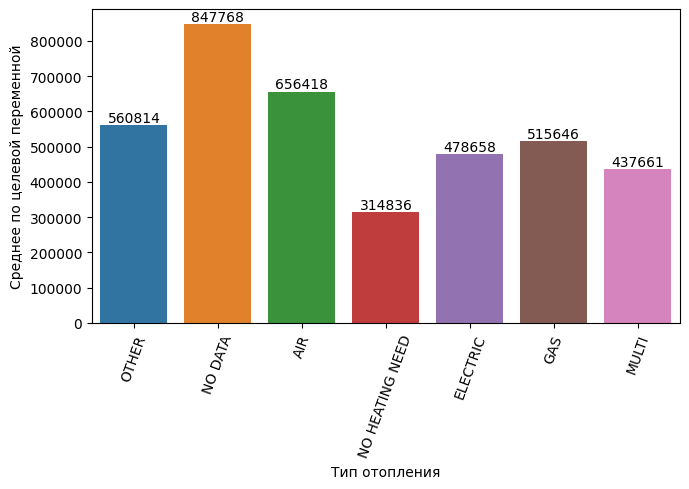

In [288]:
fig, ax = plt.subplots(figsize=(7,5))
fig = sns.barplot(x='heating_system', y='target_clean', data=df_clea, estimator='mean', errorbar=None)
plt.xticks(rotation=70)
plt.tight_layout()
ax.set_xlabel("Тип отопления")
ax.set_ylabel("Среднее по целевой переменной")
ax.bar_label(ax.containers[0]);

Каких-то существенных отличий не наблюдается, однако, при отсутствии данных об отоплении цены немного выше. Если отопления - не требуется (= земля) цена ниже

In [289]:
#изучим и поработаем с полем cooling

#количество и доля пропусков
print('Количество пропусков', df_clea['cooling'].isna().sum())
print('Доля пропусков',round((df_clea['cooling'].isna().sum()+10395)/len(df_clea),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_clea['cooling'].str.lower().nunique())

Количество пропусков 128249
Доля пропусков 0.374
______________
Количество уникальных значений 1422


Признак cooling исключу из обработки ввиду более 35% пропусков. Также в данных присутствует "No Data" заполнения еще у 10395 наблюдений. Итого более 37% пропусков и сложно выделяемые категории признаков.
Также при изучении признака есть существенные подозрения, что частично поле заполено информацией о типе отопления, а эту информацию мы уже обработали.

In [290]:
#изучим и поработаем с полем parking

#количество и доля пропусков
print('Количество пропусков', df_clea['parking'].isna().sum())
print('Доля пропусков',round((df_clea['parking'].isna().sum())/len(df_clea),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_clea['parking'].str.lower().nunique())

Количество пропусков 174943
Доля пропусков 0.472
______________
Количество уникальных значений 3297


Признак наличия паркинга исключу из обработки ввиду более 45% пропусков. Также в данных присутствует "No Data" заполнения еще у 13021 наблюдений. Итого более 50% пропусков и сложно выделяемые категории признаков.

In [291]:
#изучим и поработаем с полем schools

#количество и доля пропусков
print('Количество пропусков', df_clea['schools'].isna().sum())
print('Доля пропусков',round(df_clea['schools'].isna().sum()/len(df_clea),3))
print("______________")

#количество уникальных значений
print('Количество уникальных значений', df_clea['schools'].str.lower().nunique())

Количество пропусков 0
Доля пропусков 0.0
______________
Количество уникальных значений 292211


In [292]:
#в признаке зашифрован рейтинг школ, расстояние до школы, тип школы, наименование школы.
#из возможного попробую выделить средний рейтинг школ по близости и минимальное расстояние до школы
#название школ думаю точно непринципиально, а как обработать тип, я не придумала..
df_clea['schools'][0]

'[{\'rating\': [\'4\', \'4\', \'7\', \'NR\', \'4\', \'7\', \'NR\', \'NR\'], \'data\': {\'Distance\': [\'2.7 mi\', \'3.6 mi\', \'5.1 mi\', \'4.0 mi\', \'10.5 mi\', \'12.6 mi\', \'2.7 mi\', \'3.1 mi\'], \'Grades\': [\'3–5\', \'6–8\', \'9–12\', \'PK–2\', \'6–8\', \'9–12\', \'PK–5\', \'K–12\']}, \'name\': [\'Southern Pines Elementary School\', \'Southern Middle School\', \'Pinecrest High School\', \'Southern Pines Primary School\', "Crain\'s Creek Middle School", \'Union Pines High School\', \'Episcopal Day Private School\', \'Calvary Christian Private School\']}]'

In [293]:
#раскодируем словарь
df_clea['schools'] = df_clea['schools'].apply(eval)

#заберем признаки для обработки
df_clea['ratings'] = df_clea['schools'].apply(lambda x: x[0]['rating'])
df_clea['distance_to_school'] = df_clea['schools'].apply(lambda x: x[0]['data']['Distance'])

In [294]:
df_clea['ratings'] = df_clea['ratings'].astype(str).str.replace('/10','', regex=False).str.findall(r'\b([0-9])\'')
df_clea['mean_rating'] = df_clea['ratings'].apply(lambda x: np.average([int(i) for i in x]))
df_clea['mean_rating'].head(3)

c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)


0    5.200000
1    4.000000
2    6.666667
Name: mean_rating, dtype: float64

In [295]:
#изучим и поработаем с полем ratings

#количество и доля пропусков
print('Количество пропусков', df_clea['mean_rating'].isna().sum())
print('Доля пропусков',round(df_clea['mean_rating'].isna().sum()/len(df_clea),3))
print("______________")

#Анализ признака
print(df_clea['mean_rating'].describe())

Количество пропусков 5594
Доля пропусков 0.015
______________
count    365142.000000
mean          4.938800
std           1.843415
min           1.000000
25%           3.500000
50%           5.000000
75%           6.333333
max           9.000000
Name: mean_rating, dtype: float64


In [296]:
#заменим пропуски на среднее значение без пропусков
mean_rating = df_clea[df_clea['mean_rating'].isna() == False]['mean_rating'].mean()
print(mean_rating)
df_clea['mean_rating']= df_clea['mean_rating'].fillna(mean_rating)

4.938800272260939


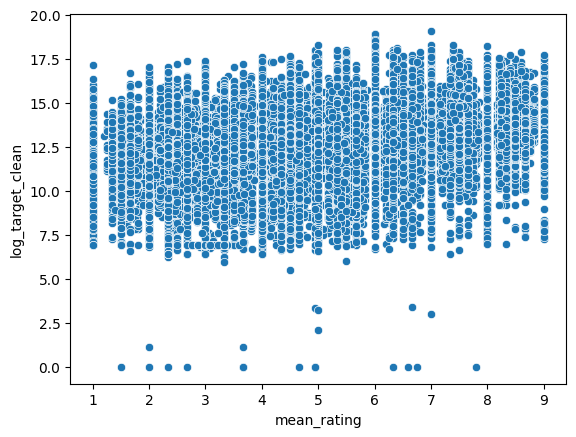

In [297]:
#визуализируем зависимость цены от среднего рейтинга
sns.scatterplot(data=df_clea, x="mean_rating", y="log_target_clean");

Визуально сделать вывод о наличие связи данных переменных сложно

In [298]:
#изучим и поработаем с полем distance_to_school
df_clea['distance_to_school']

0         [2.7 mi, 3.6 mi, 5.1 mi, 4.0 mi, 10.5 mi, 12.6...
1                                  [1.65mi, 1.32mi, 1.01mi]
2                                  [1.19mi, 2.06mi, 2.63mi]
3                           [1.05mi, 0.1mi, 1.05mi, 0.81mi]
4                                  [5.96mi, 3.25mi, 3.03mi]
                                ...                        
374405                                     [0.4 mi, 0.1 mi]
374406                                    [32.1 mi, 1.1 mi]
374407                             [10.61mi, 1.42mi, 0.4mi]
374408                                     [0.48mi, 0.73mi]
374409                             [0.3 mi, 1.1 mi, 4.1 mi]
Name: distance_to_school, Length: 370736, dtype: object

In [299]:
df_clea['distance_to_school'] = df_clea['distance_to_school'].astype(str).str.findall(r'\b([0-9]+.[0-9]+)')
df_clea['min_dist_school'] = df_clea['distance_to_school'].apply(lambda x: [float(i) for i in x]).apply(lambda x: -1 if len(x)==0 else min(x))
df_clea['min_dist_school'].head(3)

0    2.70
1    1.01
2    1.19
Name: min_dist_school, dtype: float64

In [300]:
#заменим пропуски на среднее значение без пропусков (напомню, что ранее их заменили на -1)
mean_dist_school = df_clea[df_clea['min_dist_school'] != -1]['min_dist_school'].mean()
print(mean_dist_school)
df_clea['min_dist_school'] = df_clea['min_dist_school'].apply(lambda x:  mean_dist_school if x==-1 else x)

1.2324911149568987


In [301]:
df_clea['min_dist_school'].describe()

count    370736.000000
mean          1.232491
std           5.443098
min           0.000000
25%           0.380000
50%           0.700000
75%           1.300000
max        1590.380000
Name: min_dist_school, dtype: float64

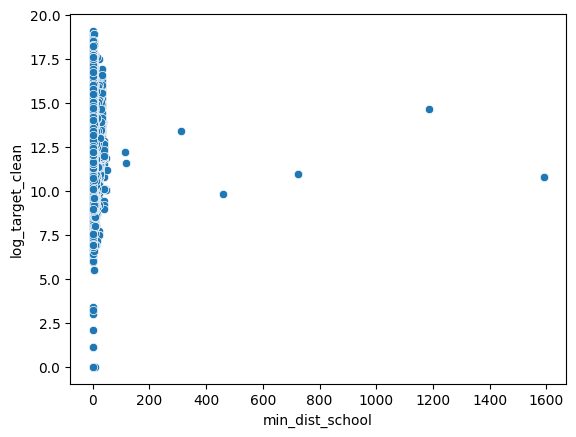

In [302]:
#анализ статистик указал на наличие выбросов
sns.scatterplot(data=df_clea, x="min_dist_school", y="log_target_clean");

In [303]:
#заменим выбросы на средние значения
df_clea['min_dist_school'] = df_clea['min_dist_school'].apply(lambda x: mean_dist_school if x > 100 else x)

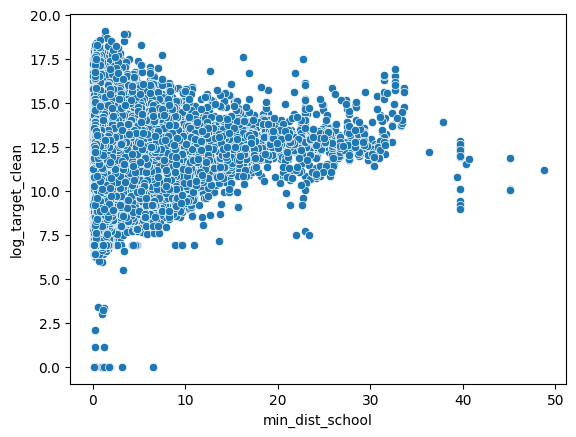

In [304]:
#анализ статистик указал на наличие выбросов
sns.scatterplot(data=df_clea, x="min_dist_school", y="log_target_clean");

Визуально сделать вывод о наличие связи данных переменных сложно

Остальные признаки удалю. 

При изучении и предварительных подходах к обработке определила нецелесообразность траты времени на них, тк не ожидаю (исключительно моя точка зрения) 
действительно существенного влияния данных признаков на целевой признак:
-beds - 24.2% пропусков, 715 уникальных значений, качество заполнения признака крайне низкое (содержится информация о ванных, размере помещений и проч)
-stories - 	40.0% пропусков, 347 уникальных значений, 30% заполненных полей так или иначе отображают 1 этаж

а также те признаки, что были получены из информации о индексе считаю более "чистыми", поэтому не вижу смысла инвестировать в очистку данных признаков
-street
-city
-state

также удалим исходные поля, которые были обработаны


In [305]:
df_clea.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'homeFacts', 'schools', 'zipcode',
       'stories', 'target', 'target_clean', 'log_target_clean',
       'private_pool_join', 'mlsid_join', 'mlsid_join_bool', 'sqft_clean',
       'log_sqft_clean', 'baths_clean', 'fireplace_booled', 'major_city',
       'population', 'lat ', 'lng', 'state_zip', 'median_household_income',
       'housing_units', 'occupied_housing_units', 'major_city_ch', 'status_cl',
       'property_type_fin', 'year_built', 'remodeled_year', 'heating',
       'cooling', 'parking', 'lotsize', 'facts_year_build', 'home_age',
       'remodeled_year_bool', 'heating_system', 'ratings',
       'distance_to_school', 'mean_rating', 'min_dist_school'],
      dtype='object')

In [308]:
df_clean = df_clea.drop(['stories',
                         'homeFacts', 'schools', 'target',
                         'mlsid_join', 'major_city',
                        'heating', 'cooling', 'parking', 'lotsize',
                        
                        'year_built','remodeled_year', 'facts_year_build',
                         
                         'ratings', 'distance_to_school',
                        
                        'Unnamed: 0.1', 'Unnamed: 0'], axis = 1)

In [309]:
df_clean.columns

Index(['zipcode', 'target_clean', 'log_target_clean', 'private_pool_join',
       'mlsid_join_bool', 'sqft_clean', 'log_sqft_clean', 'baths_clean',
       'fireplace_booled', 'population', 'lat ', 'lng', 'state_zip',
       'median_household_income', 'housing_units', 'occupied_housing_units',
       'major_city_ch', 'status_cl', 'property_type_fin', 'home_age',
       'remodeled_year_bool', 'heating_system', 'mean_rating',
       'min_dist_school'],
      dtype='object')

In [310]:
#удалим дубликаты
print('Количество дубликатов: {}'.format(df_clean[df_clean.duplicated()].shape[0]))
df_clean = df_clean.drop_duplicates()
df_clean.shape

Количество дубликатов: 5367


(365369, 24)

In [311]:
#сохраним обработанный датасет
df_clean.to_csv('output\df_clean.csv') 

In [312]:
profile = ProfileReport(df_clean, title="Data analitical preview after EDA")
profile.to_file("Data analitical preview after EDA")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\ydata_profiling\profile_report.py:360: UserWarning: Extension  not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Перейдем к следующему этапу